# MSDS688 - Artifical Intelligence

## Week 4 - Constraint Satisfaction Problems

In [1]:
from IPython.display import HTML, Image, YouTubeVideo

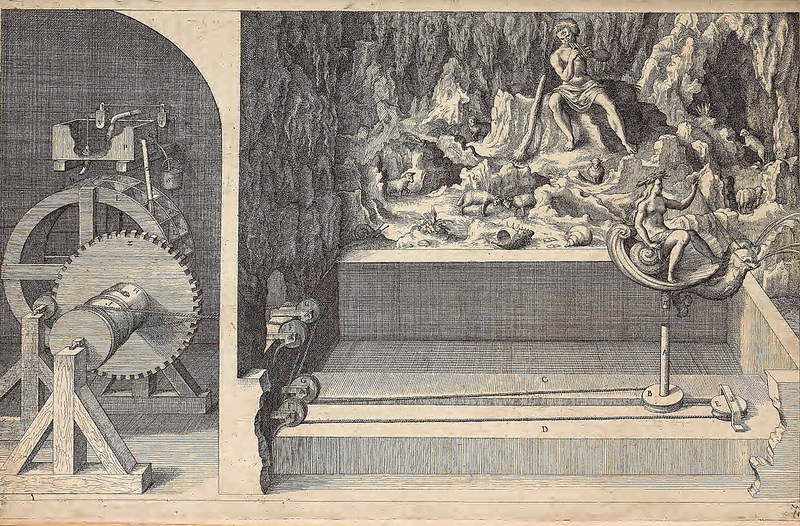

In [2]:
Image('images/medieval_hydraulic_engineering.jpg')

French King Henri IV hired the Italian engineer Tomaso Francini to build him some waterworks for the royal palace at Saint Germain en Laye. Francini built hydraulic grottoes devoted to the Greek pantheon and their adventures: Mercury played a trumpet and Orpheus his lyre; Perseus freed Andromeda from her dragon. There were automaton blacksmiths, weavers, millers, carpenters, knife-grinders, fishermen, and farriers conducting the obligatory watery attacks on spectators.

Cite: Riskin, J. (n.d.). Frolicsome Engines: The Long Prehistory of Artificial Intelligence. Retrieved April 10, 2018, from [https://publicdomainreview.org/2016/05/04/frolicsome-engines-the-long-prehistory-of-artificial-intelligence/](https://publicdomainreview.org/2016/05/04/frolicsome-engines-the-long-prehistory-of-artificial-intelligence/)

# Concise Review of Adversarial Search

## Minimax

* Based on DFS
* Searches to constant depth
* Evaluates each board at that depth
* Number of evaluated nodes grows exponentially
    * b == branching factor with one branch per action
    * m == depth 
    * Number of evaluated nodes = b^m
* MIN and MAX must take what the other gives

## Minimax Example

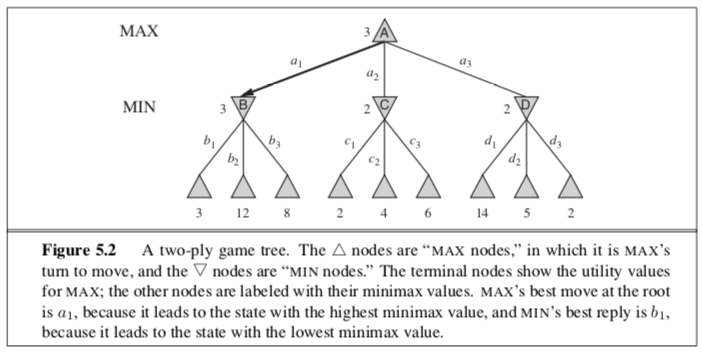

In [3]:
Image('images/Figure-S5-2-minmax-tree-example.png')

# Alpha-Beta

* Alpha-Beta is layered on top of minimax

* Remember that minimax search is depth-first

* Only consider nodes along a single path

* Alpha–beta pruning uses two parameters describing the bounds on backed-up values found along the path:

    - α = highest-value found so far for MAX along path.

    - β = lowest-value found so far for MIN along path.
    
* Once a better play has been found, prune all other branches as high in the tree as possible.

## Alpha-Beta Example

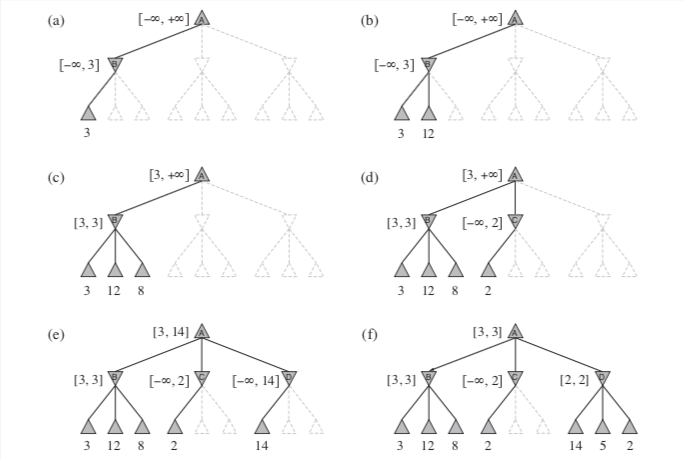

In [4]:
Image('images/Figure-S5-5-alphpabeta-pruning-example.png')

# Tonight

Tonight we are going to learn how to use constraint to make solutions easy to find.  Apply this to coloring maps and scheduling talks.

# Knowledge representation - Say HELLO to factored representations


* Atomic representations is what we have used in our study of search

* Factored representation 
    
    - Splits up each state into a fixed set of variables or attributes, each of which can have a value

    - Commonly used in machine learning tasks

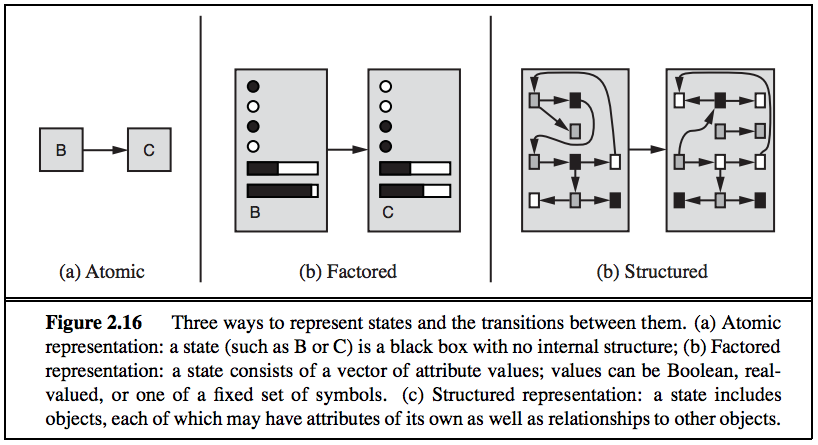

In [5]:
Image('images/Figure-S2-16-state-representations.png')

# Constraint satisfacation problems

* General problem solving technique

* Set of _variables_ that can take on values

* Set of _values_ each variable can assume

* Constriants limit values of _local_ variables can assume

* Solutions must satisfy all constraints (_equal_, _not_equal_, ...)

* __Resulting in a radical reduction in the size of the search space__

## Example: Map coloring 

* Coloring a map so that no adjacent polygons are the same color

* Domain - {Red, Green, Blue}

* Variable - Colorado

* Constraint - Not equal to adjacent state

* Graph theory 
    - Planar graph can _always_ be colored using just 4 colors
    - A planar graph has no crossing edges

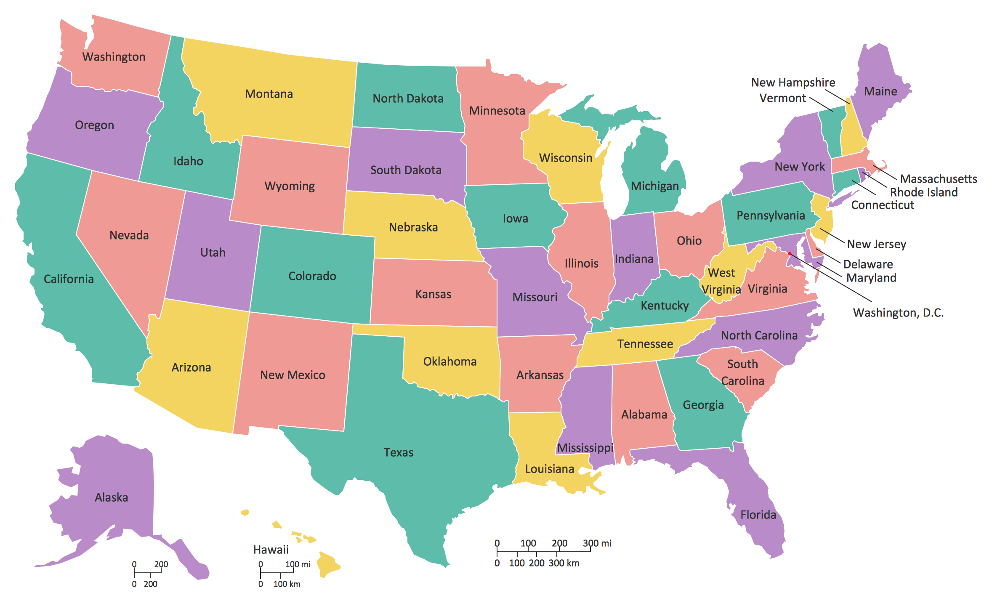

In [6]:
Image('images/usa-states-map.png')

Cite: http://www.conceptdraw.com/How-To-Guide/geo-map-america-united-states

# How do we represent a map as a graph?

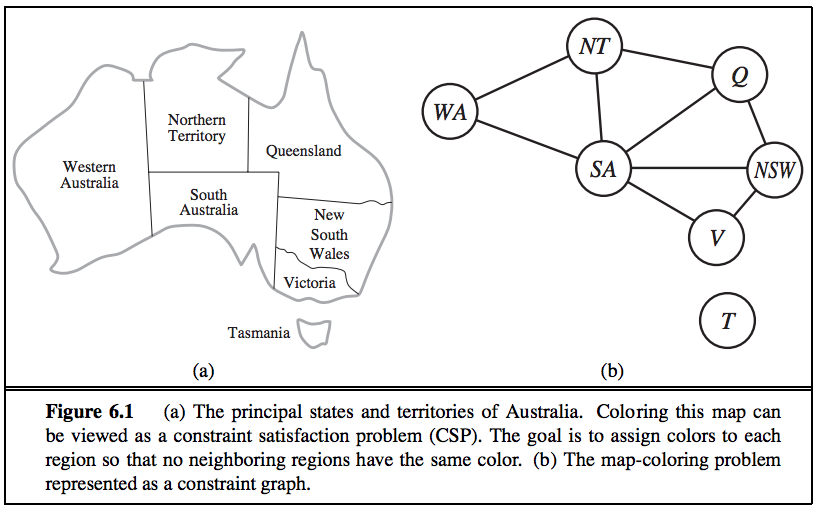

In [7]:
Image('images/Figure-S6-1-graph-coloring.png')

# 

* CSP
    - Variables:   Q, NSW, V, T, SA, NT, WA
    - Domains:     {Green, Yellow, Purple}
    - Constraints: No adjacent territory can be the same color
    
 

# Map Coloring Exercise

* Can you color Australia with just 3 colors?

* Google _aima-javascript_

* Click on View the Visualizations > Go to Part 2 > Chapter 6 Constraint Satisfation Problems

* Or, just go to [AIMA Visualizations - Constrain Satisfaction](http://aimacode.github.io/aima-javascript/6-Constraint-Satisfaction-Problems/) 

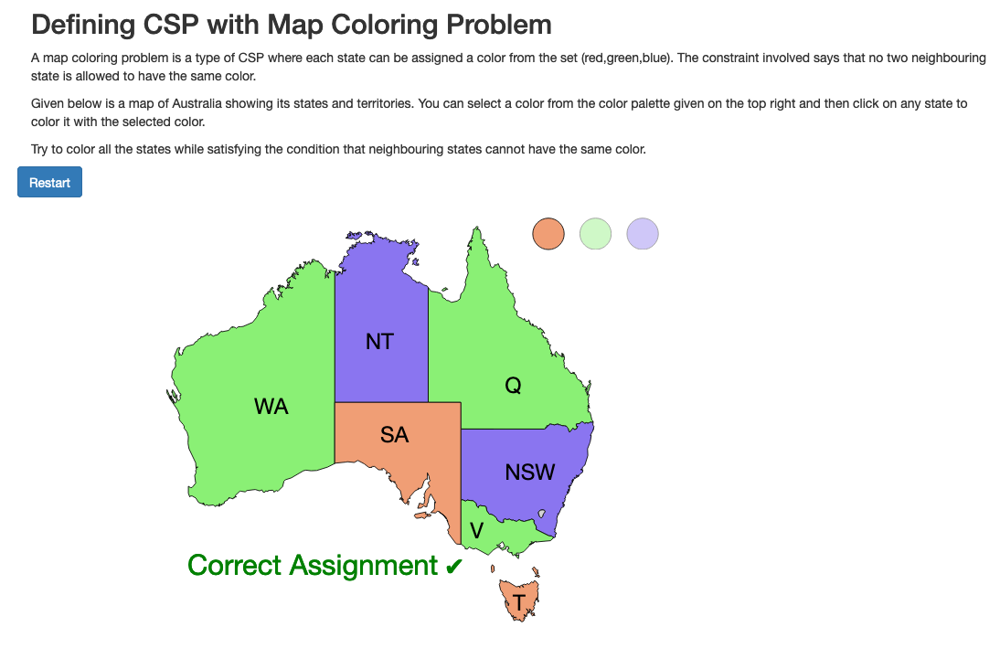

In [8]:
Image('images/map-coloring-solution.png')

## Example: Scheduling

* Domain - Time range

* Variable - Start time, end time

* Constraint - Start_Time_2 > Start_Time_1 + Duration_1

# Solving CSPs with Search

---

## Depth First Search (DFS)

* Chooses values from domain

* Assigns a value choosen to avariable

* Checks for contradictions 

* Bactracks when a contradition is found

* Not guaranteed to find a solution

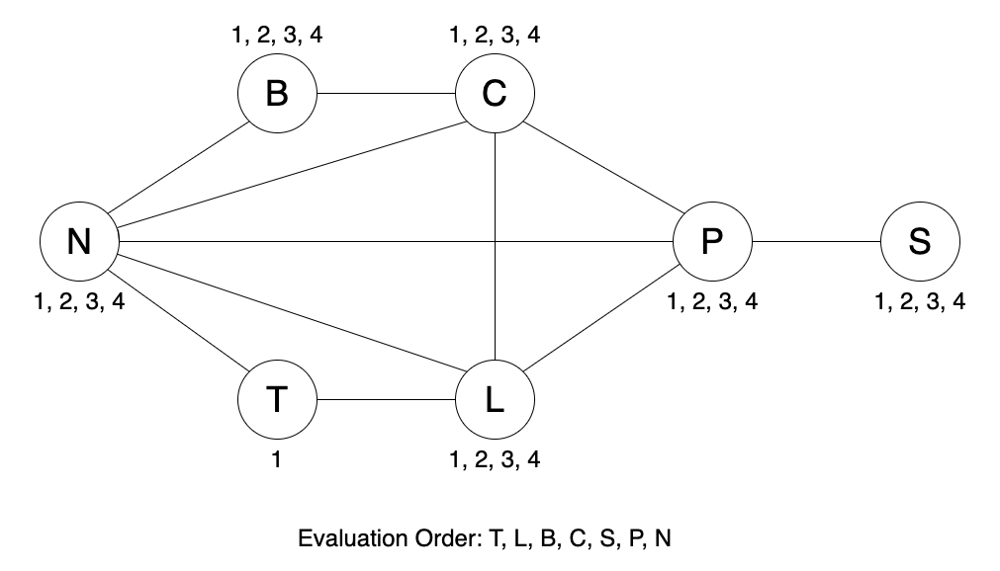

In [9]:
Image('./images/time-travelers-convention_order_for_slides.png')

## Solution

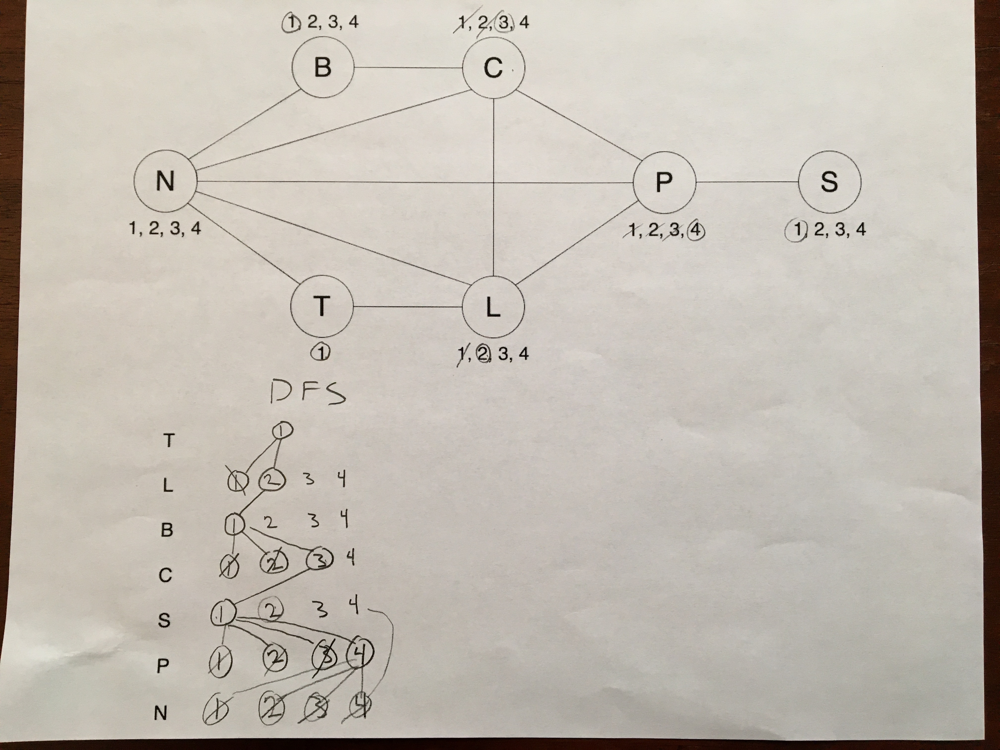

In [4]:
Image('./images/time-traverlers-dfs-solution.jpg')

---

## DFS + Forward Checking (FC)

* Idea: Look ahead and prune domains of unassigned variables

* After assignment eliminate incompatible values from neighboring domains

* Re-instate values when backtracking

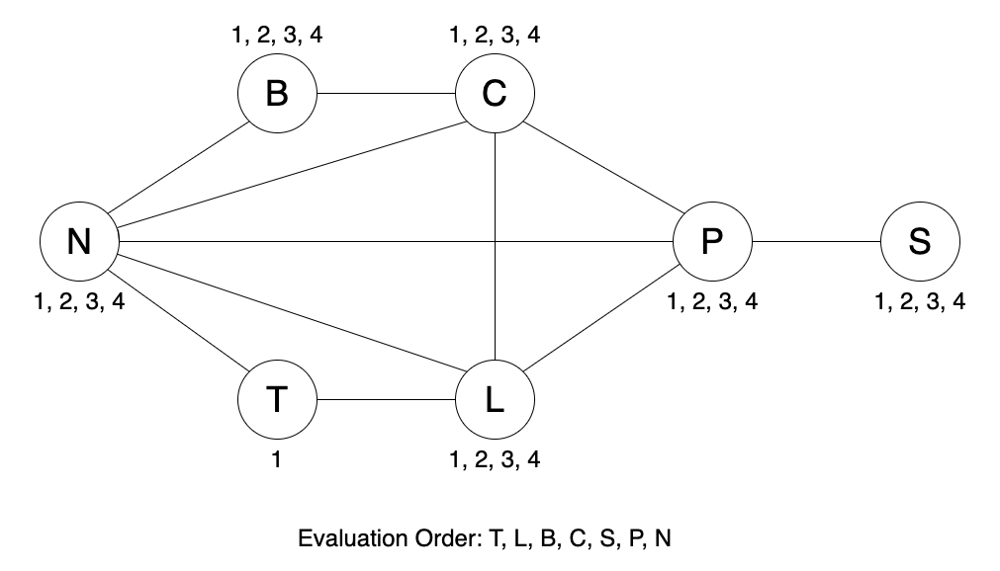

In [10]:
Image('./images/time-travelers-convention_order_for_slides.png')

## Solution

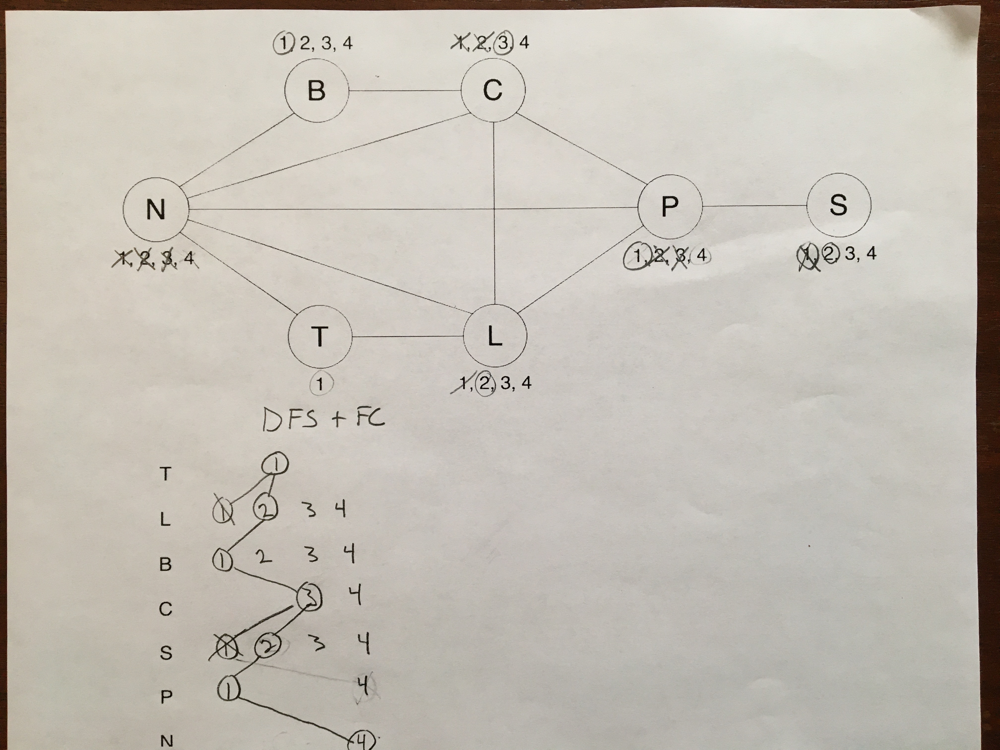

In [3]:
Image('./images/time-traverlers-dfs+fc-solution.jpg')

---

## DFS + FC + Propagation through singleton domains

* Perform DFS + FC 

* If a _new_ singleton domains are created propagate through the singleton's neighbors

* Propigate means _removing inconsistent values from neighboring domains_

* If a new singleton results, propagate it too

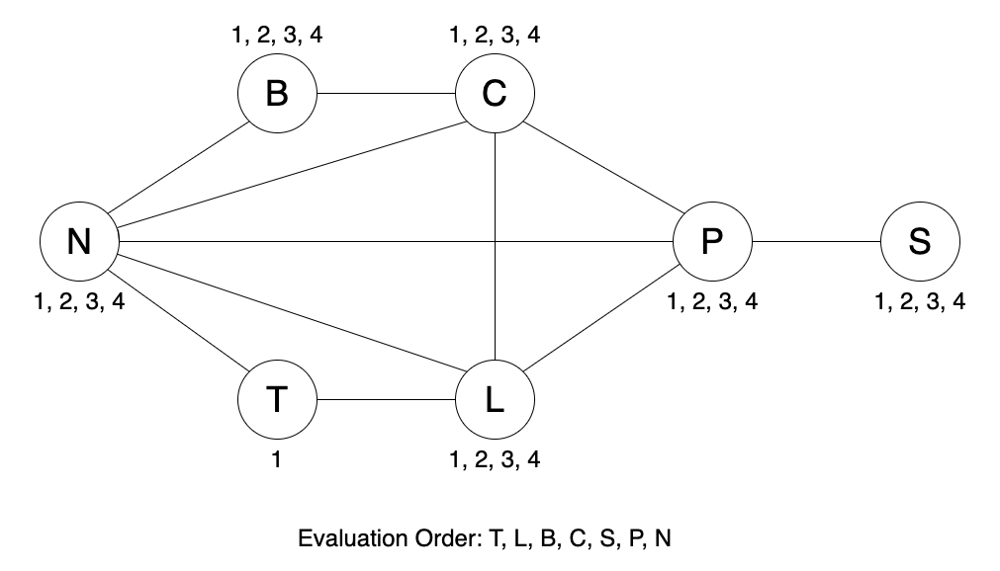

In [11]:
Image('./images/time-travelers-convention_order_for_slides.png')

## Solution

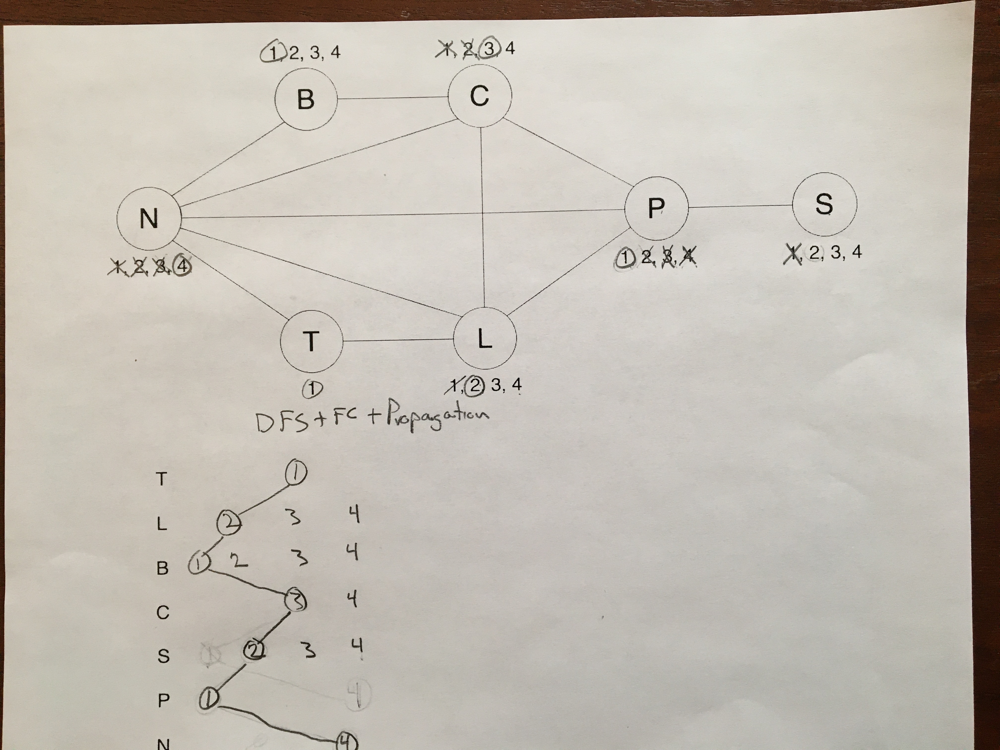

In [4]:
Image('./images/time-traverlers-dfs+fc+prop-solution.jpg')

# Break 

# Simplifying Search by Pre-Processing 

* Start on the node with the smallest domain

* Remove any domain elements from adjacent domains for which there is no solution to the constraint

* Repeat this process until all constraints are consistent in both directions

## Arc Consistency

* Remove domain elements that violate constraints(inconsistent)

* Search is simplified and more efficient

## Example

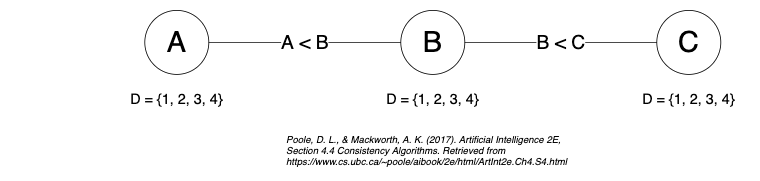

In [12]:
Image('images/arc-consistency-graph.png')

## Issue: Search repeatedly evaluates inconsistent domains

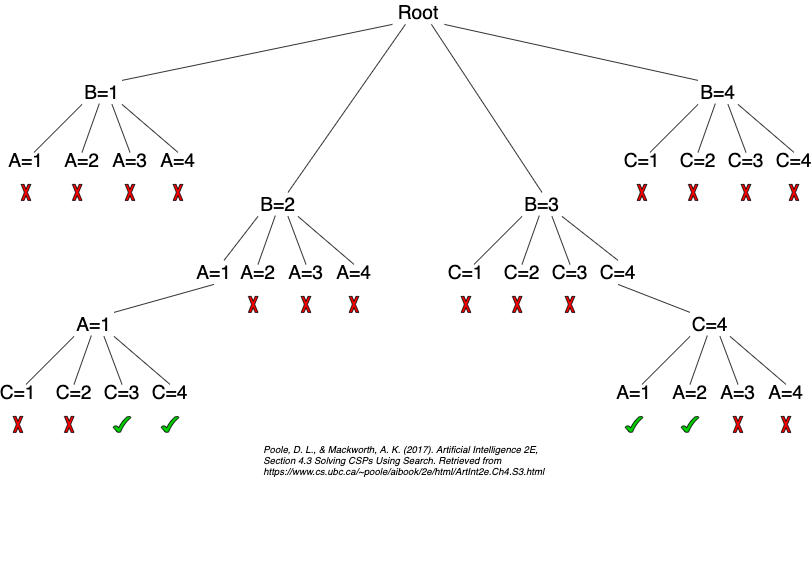

In [13]:
Image('images/arc-consistency-tree.png')

# Preprocessing

__Idea: Eliminate conflicting domain values _before_ search__

## AC-3 Algorithm

__function__ AC-3(_csp_) __returns__ false if an inconsistency is found and true otherwise 

&emsp;__inputs__: _csp_, a binary CSP with components (_X_, _D_, _C_) 

&emsp;__local variables__: _queue_, a queue of arcs, initially all the arcs in _csp_  

&emsp;__while__ _queue_ is not empty __do__  
&emsp;&emsp;&emsp;(_X<sub>i</sub>_, _X<sub>j</sub>_) &larr; REMOVE\-FIRST(_queue_) 

&emsp;&emsp;&emsp;__if__ REVISE(_csp_, _X<sub>i</sub>_, _X<sub>j</sub>_) __then__  
&emsp;&emsp;&emsp;&emsp;&emsp;__if__ size of _D<sub>i</sub>_ = 0 __then return__ _false_  
&emsp;&emsp;&emsp;&emsp;&emsp;__for each__ _X<sub>k</sub>_ in _X<sub>i</sub>_.NEIGHBORS &minus; \{_X<sub>j</sub>_\} __do__  
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;add(_X<sub>k</sub>_, _X<sub>i</sub>_) to _queue_  
&emsp;__return__ _true_

---

__function__ REVISE(_csp_, _X<sub>i</sub>_, _X<sub>j</sub>_) __returns__ true iff we revise the domain of _X<sub>i</sub>_  
&emsp;_revised_ &larr; _false_  
&emsp;__for each__ _x_ __in__ _D<sub>i</sub>_ __do__  
&emsp;&emsp;&emsp;__if__ no value _y_ in _D<sub>j</sub>_ allows (_x_, _y_) to satisfy the constraint between  _X<sub>i</sub>_ and _X<sub>j</sub>_ __then__  
&emsp;&emsp;&emsp;&emsp;delete _x_ from _D<sub>i</sub>_  
&emsp;&emsp;&emsp;&emsp;_revised_ &larr; _true_  
&emsp;__return__ _revised_  

---

## Practice exercise using AC-3

* AC-3 is a preprocessing step to reduce the search space prior to search

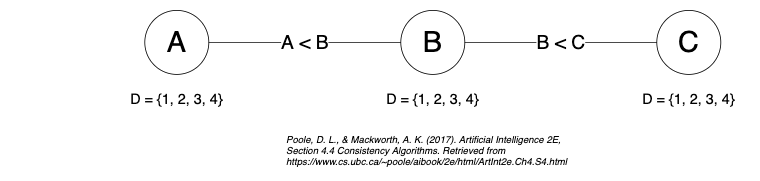

In [14]:
Image('images/arc-consistency-graph.png')

## Solution

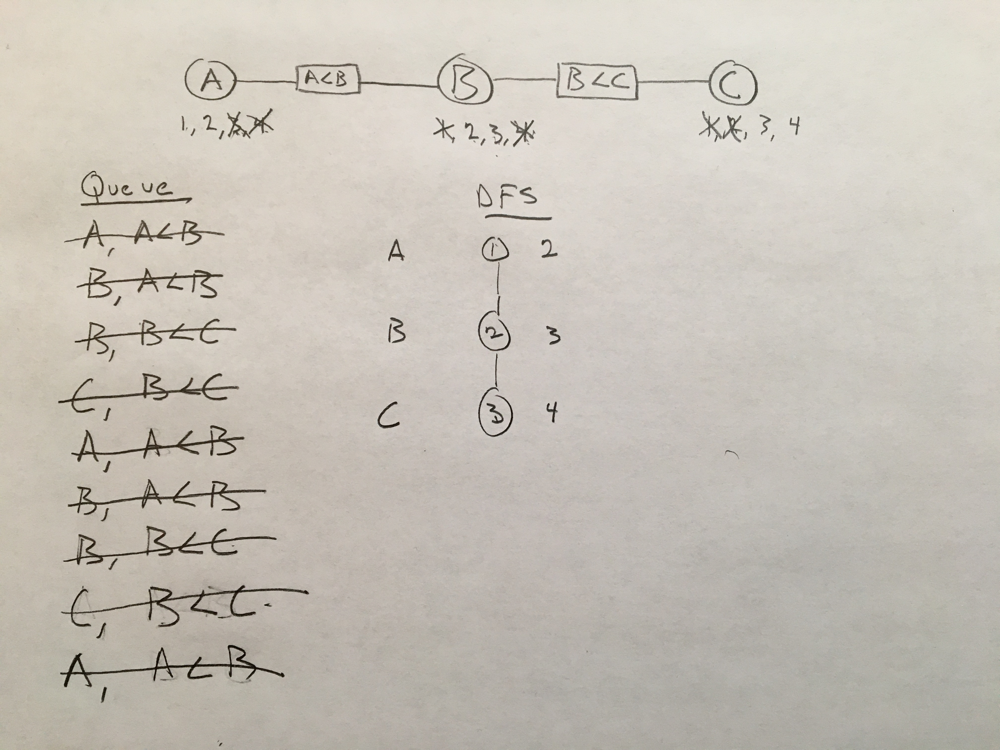

In [6]:
Image('images/ac-3+dfs-solution.jpg')

# Summary

* Use search to find solutions to constraint satisfaction problems (CSP)

* Search finds solutions by choosing domain values and making assignments

* Arc-consistency algorithms
    * Remove domain values that are inconsistent with constraints
    * Make search more effective

* CSPs with no solution are elimnated by both search and arc-consistency algorithms

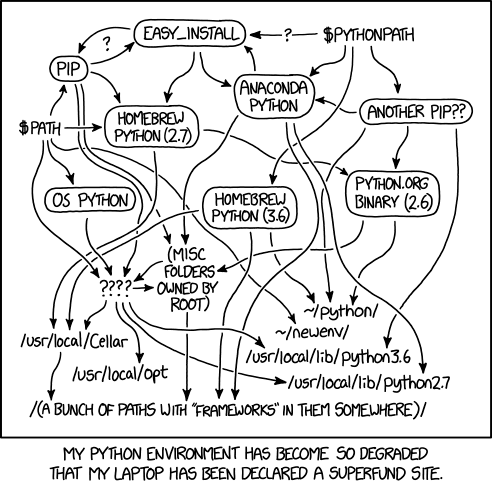

In [15]:
Image('https://imgs.xkcd.com/comics/python_environment.png')